<a href="https://colab.research.google.com/github/Justin-Jonany/IndoFoodNet/blob/main/6_evaluation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IndoFoodNet
IndoFoodNet aims to create a neural networks model that correctly classifies images of 9 differet Padang food. The dataset is taken from https://www.kaggle.com/datasets/faldoae/padangfood.

</br>

This notebook aims to evaluate all the models and decide on the final model

## Libraries

In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import itertools
import os

## Helper Function

In [ ]:
def grab_label(test_data):
  '''
  Unbatches the test data and returns the true labels in an array

  Args:
    test_data: batched dataset
  '''
  true_labels = []
  for images, labels in test_data.unbatch():
    true_labels.append(labels.numpy().argmax())
  return true_labels

def predict_data(model, data):
  '''
  Predicts data with model and returns the predicted class

  Args:
    model: a machine learning model
    data: batched dataset
  Returns:
    prediction: predicted class
  '''
  prediction = model.predict(data, verbose=0)
  prediction = tf.math.argmax(prediction, axis=1)
  return prediction

def random_visualize(model, data, class_names):
  '''
  Randomly select an image from data and create a prediction with model.

  Args:
    model: a machine learning model
    data: batched dataset
    class_names: list of class names in the dataset in the order of the labels array
  Returns:
    prediction: predicted class
  '''

  batches = []
  for i in iter(data):
    batches.append(i)

  random_batch = batches[np.random.randint(0, len(data))]
  images, labels = random_batch
  random_image_index = np.random.randint(0, len(images))
  random_image, random_label = images[random_image_index], labels[random_image_index]
  class_name = class_names[np.argmax(random_label)]

  pred_probs = model.predict(tf.expand_dims(random_image, 0))

  pred = class_names[np.argmax(pred_probs)]

  random_image = random_image /255.
  plt.imshow(random_image)
  plt.title(f'Predicted class: {pred} \n Actual class: {class_name} \n probability: {pred_probs.max(): .2f}', color=('green' if pred == class_name else 'red'))
  plt.axis(False)

def batch_visualize(model, data, class_names, batch_number):
  '''
  Visualize the batch-number-th batch in data and create a prediction with model.

  Args:
    model: a machine learning model
    data: batched dataset
    class_names: list of class names in the dataset in the order of the labels array
    batch_number: the batch index to visualize
  Returns:
    prediction: predicted

  '''

  # Turn the data into a list of batches
  batches = []
  for i in iter(data):
    batches.append(i)

  # Get the batch
  batch = batches[batch_number]

  # Unpack the batch into image and label
  images, labels = batch

  # Turn the labels into class_names
  labels_names = np.argmax(labels, axis=1)
  labels_names =[class_names[i] for i in labels_names]

  # Predict and turn the labels into class_names
  pred_probs = model.predict(images)
  preds = np.argmax(pred_probs, axis=1)
  preds = [class_names[i] for i in preds]

  # Rescale
  images = tf.keras.layers.Rescaling(1./255)(images)

  # Plotting
  fig = plt.figure(figsize=(25, 25), frameon=True)
  for i in range(len(images)):
    plt.subplot(8, 4, i + 1)
    plt.imshow(images[i])
    plt.title(f'Predicted class: {preds[i]} \n Actual class: {labels_names[i]} \n probability: {pred_probs[i].max() * 100: .2f}%',
              color=('green' if preds[i] == labels_names[i] else 'red'),
              weight=(None if preds[i] == labels_names[i] else 'bold'))
    plt.axis(False)

  plt.tight_layout(w_pad = 0.6, h_pad=2)
  fig.suptitle(f'Predictions of batch {batch_number}', fontsize=30, y=1.02)
  plt.show()
  return fig;

def f1_comparison(models_and_names, datas, title, f1=True):
  '''
  Creates predictions with models in models_and_names on it's corresponded data
  in datas. From the predicionts, weighted f1-scores is gathered and plotted into
  a bar graph. If f1 is false, then it will compute accuracy

  Args:
    models_and_names: a dictionary of names (as key) and models (as values)
    datas: batched dataset for each models
    title: title of the graph
    f1: if f1 is False, then it will compute accuracy

  Return:
    weighted f1-scores of each model or accuracy score of each model
  '''

  # Gathering data and predicting
  models = models_and_names['models']
  names = models_and_names['names']
  true_labels = tf.constant([grab_label(test_data) for test_data in datas]);
  predictions = [predict_data(model, test_data) for model, test_data in zip(models, datas)];

  # getting the f1_scores/accuracy score
  if f1:
    scores = [f1_score(true_labels[i], predictions[i], average='weighted') for i in range(len(models))];
  else:
    scores = [accuracy_score(true_labels[i], predictions[i]) for i in range(len(models))];

  # plotting

  # setting up the colors for labels
  denominator = max(scores) - min(scores)
  scaled_data = [(datum-min(scores))/denominator for datum in scores]
  colors = []
  cmap = plt.colormaps['viridis']
  for decimal in scaled_data:
      colors.append(cmap(decimal));

  # making a bar plot
  bar = plt.bar(names, scores, label=names, color=colors)

  # elements
  plt.ylim(0.85, 0.95)
  plt.bar_label(bar, fmt='%.4f')
  plt.title(title)
  plt.xlabel('Model')
  plt.ylabel('F1 Score' if f1 else 'Accuracy Score')
  plt.legend();
  plt.show();
  return scores

def get_models_from_dir(path):
  '''
  get all models from path, assumes all the files in the dir are models
  '''
  models = []
  for filename in os.listdir(path):
    if path[-1] == '/':
      models.append(tf.keras.models.load_model(path + filename))
    else:
      models.append(tf.keras.models.load_model(path + '/' + filename))
  return models

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).

  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])

  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()
  ax.tick_params(axis='x', labelrotation=45)


  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
  plt.show()
  return fig;

## Getting Best Models
**IMPORTANT NOTE** Best models are determined on the past notebooks based on the loss on the validation data **NOT YET ON TEST DATA**

In [ ]:
best_model_path = '/content/drive/MyDrive/ColabNotebooks/projects/IndoFoodNet/models/best_model_per_version/efficientnetv2b'
b0_model = tf.keras.models.load_model(best_model_path + '0_fine_tuned')
b1_model = tf.keras.models.load_model(best_model_path + '1_fine_tuned')
b2_model = tf.keras.models.load_model(best_model_path + '2_fine_tuned')
b3_model = tf.keras.models.load_model(best_model_path + '3_fine_tuned')

In [ ]:
best_models = [b0_model, b1_model, b2_model, b3_model]

## Getting Other Models
Some other models might perform better

In [ ]:
other_models_path = '/content/drive/MyDrive/ColabNotebooks/projects/IndoFoodNet/models/efficientnetv2'
b0_past_models = get_models_from_dir(other_models_path + 'b0')
b1_past_models = get_models_from_dir(other_models_path + 'b1')
b2_past_models = get_models_from_dir(other_models_path + 'b2')
b3_past_models = get_models_from_dir(other_models_path + 'b3')

In [ ]:
b0_past_models, b1_past_models, b2_past_models, b3_past_models

([<keras.src.engine.functional.Functional at 0x7c7652f44e80>,
  <keras.src.engine.functional.Functional at 0x7c75c26047c0>])

## Preparing Data

Getting the data for testing, the true labels, and the predictions

### Getting Test Data

In [ ]:
train_dir = '/content/drive/MyDrive/ColabNotebooks/projects/IndoFoodNet/splitted_data/train/'
class_names = os.listdir(train_dir)
class_names.sort()
class_names

['ayam_goreng',
 'ayam_pop',
 'daging_rendang',
 'dendeng_batokok',
 'gulai_ikan',
 'gulai_tambusu',
 'gulai_tunjang',
 'telur_balado',
 'telur_dadar']

In [ ]:
path = '/content/drive/MyDrive/ColabNotebooks/projects/IndoFoodNet/processed_data/'
b0_test_data = tf.data.Dataset.load(path + 'b0_test_data')
b1_test_data = tf.data.Dataset.load(path + 'b1_test_data')
b2_test_data = tf.data.Dataset.load(path + 'b2_test_data')
b3_test_data = tf.data.Dataset.load(path + 'b3_test_data')

### Getting True Labels

In [ ]:
test_datas = [b0_test_data, b1_test_data, b2_test_data, b3_test_data]

In [ ]:
true_labels = tf.constant([grab_label(test_data) for test_data in test_datas])

In [ ]:
true_labels = tf.cast(true_labels, tf.float32)

In [ ]:
true_labels[0][:10], true_labels[1][:10], true_labels[2][:10], true_labels[3][:10]

(<tf.Tensor: shape=(10,), dtype=float32, numpy=array([4., 1., 5., 8., 4., 3., 2., 7., 4., 0.], dtype=float32)>,
 <tf.Tensor: shape=(10,), dtype=float32, numpy=array([5., 4., 2., 0., 6., 3., 1., 5., 6., 2.], dtype=float32)>,
 <tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 5., 6., 2., 3., 7., 3., 2., 3., 2.], dtype=float32)>,
 <tf.Tensor: shape=(10,), dtype=float32, numpy=array([3., 7., 7., 8., 1., 7., 6., 6., 5., 4.], dtype=float32)>)

In [ ]:
true_labels_classes = [[class_names[tf.cast(label, tf.int32)] for label in labels] for labels in true_labels]

In [ ]:
true_labels_classes[0][:4], true_labels_classes[1][:4], true_labels_classes[2][:4], true_labels_classes[3][:4]

(['gulai_ikan', 'ayam_pop', 'gulai_tambusu', 'telur_dadar'],
 ['gulai_tambusu', 'gulai_ikan', 'daging_rendang', 'ayam_goreng'],
 ['ayam_goreng', 'gulai_tambusu', 'gulai_tunjang', 'daging_rendang'],
 ['dendeng_batokok', 'telur_balado', 'telur_balado', 'telur_dadar'])

## Making Various Metrics

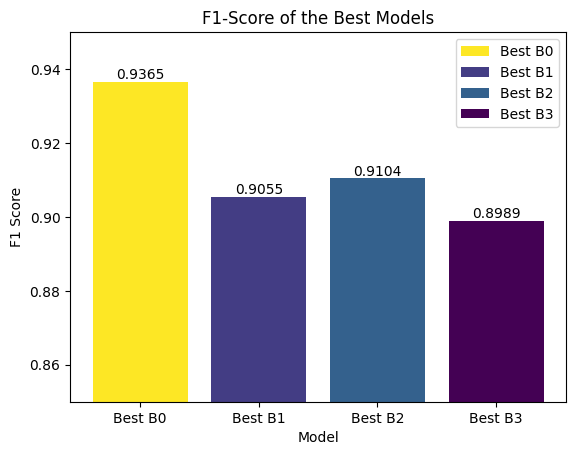

In [ ]:
names = ['Best B0', 'Best B1', 'Best B2', 'Best B3']
names_models = {'names': names,
                'models': best_models}
f1_comparison(names_models, test_datas, 'F1-Score of the Best Models');

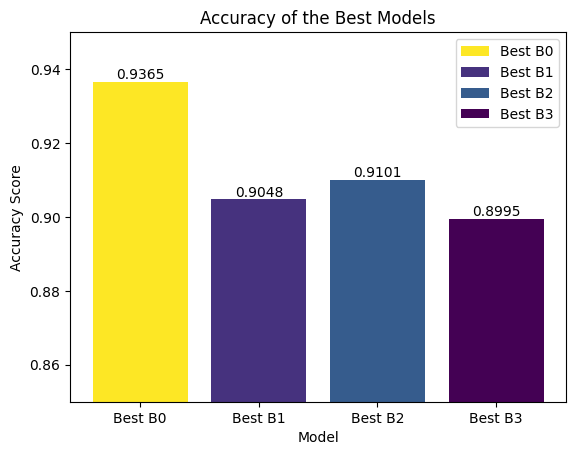

In [ ]:
f1_comparison(names_models, test_datas, 'Accuracy of the Best Models', False);

### F1-Score
Weighted F1-Score will be use

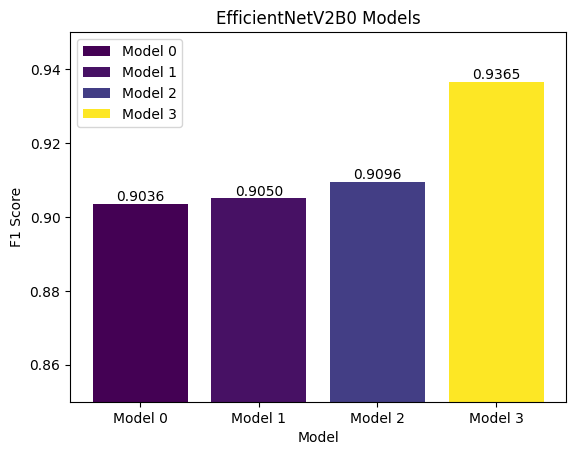

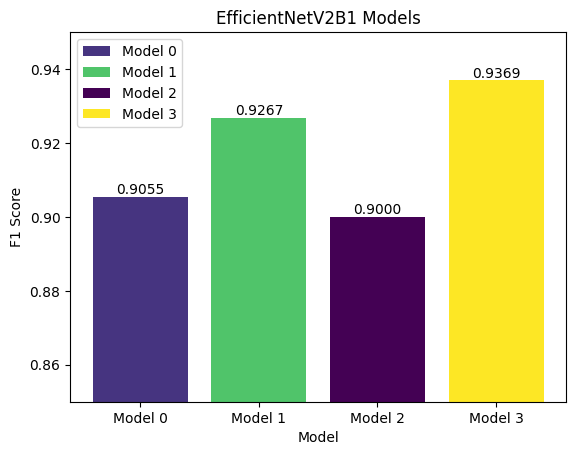

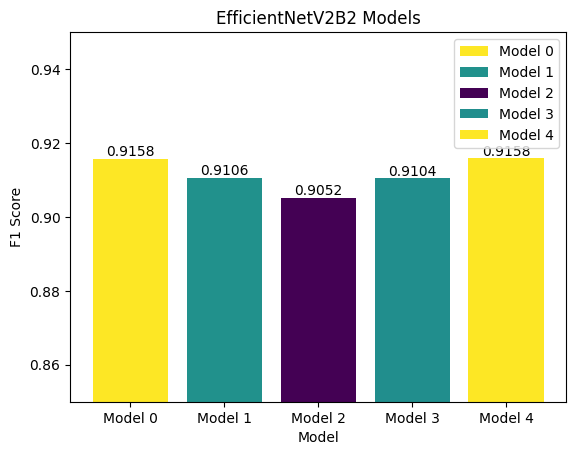

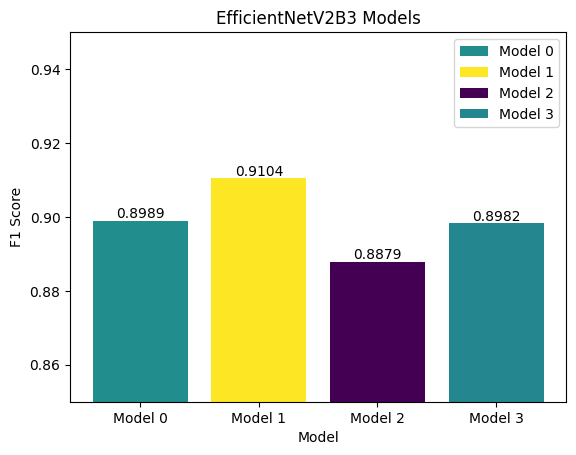

In [ ]:
all_models_types = [b0_past_models, b1_past_models, b2_past_models, b3_past_models]
all_data = [b0_test_data, b1_test_data, b2_test_data, b3_test_data]

# Saving all the f1_scores
f1_scores = []
for i, past_models in enumerate(all_models_types):
  names = ['Model ' + str(j) for j in range(len(past_models))]
  names_models = {'names': names,
                  'models': past_models}
  f1_scores.append(f1_comparison(names_models, [all_data[i]] * len(past_models), f'EfficientNetV2B{i} Models'))

In [ ]:
MAX_NUM_OF_MODELS = 5
df_f1_scores = pd.DataFrame(f1_scores,
                            index=['EfficientNetV2B0', 'EfficientNetV2B1', 'EfficientNetV2B2', 'EfficientNetV2B3'],
                            columns = ['Model ' + str(i) for i in range(MAX_NUM_OF_MODELS)]
                            ).T.round(decimals=4)
df_f1_scores

,EfficientNetV2B0,EfficientNetV2B1,EfficientNetV2B2,EfficientNetV2B3
Model 0,0.9036,0.9055,0.9158,0.8989
Model 1,0.9050,0.9267,0.9106,0.9104
Model 2,0.9096,0.9000,0.9052,0.8879
Model 3,0.9365,0.9369,0.9104,0.8982
Model 4,NaN,NaN,0.9158,NaN


In [ ]:
for i in df_f1_scores.columns:
  print('Best ' + i + ': Model ' + str(np.argmax(df_f1_scores[i])) + ' ' + str(np.round(np.max(df_f1_scores[i]), 4)))

Best EfficientNetV2B0: Model 3 0.9365
Best EfficientNetV2B1: Model 3 0.9369
Best EfficientNetV2B2: Model 4 0.9158
Best EfficientNetV2B3: Model 1 0.9104


Looks like EfficientNetV2B1's Model 3 has the best F1-Score

### Accuracy

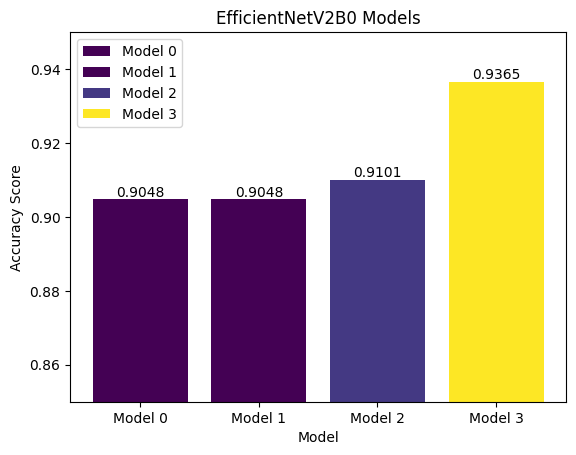

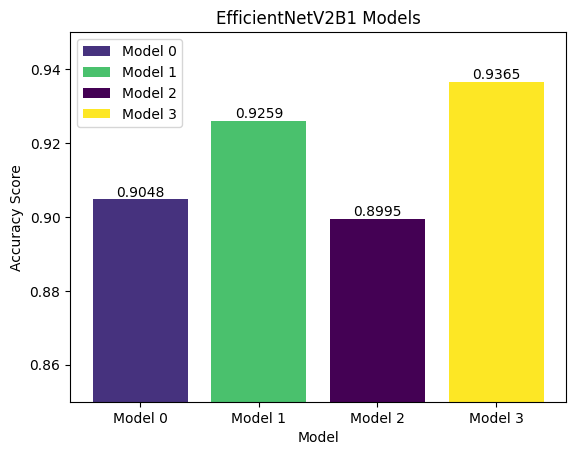

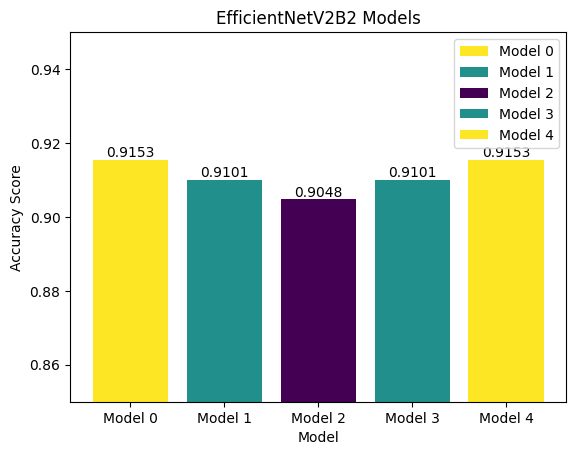

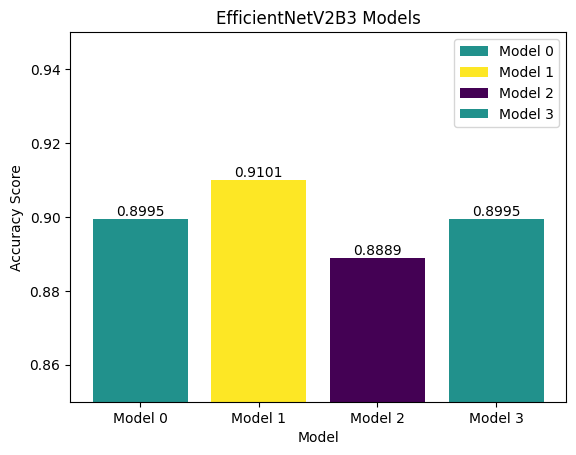

In [ ]:
all_models_types = [b0_past_models, b1_past_models, b2_past_models, b3_past_models]
all_data = [b0_test_data, b1_test_data, b2_test_data, b3_test_data]

# Saving all the f1_scores
accuracy_scores = []
for i, past_models in enumerate(all_models_types):
  names = ['Model ' + str(j) for j in range(len(past_models))]
  names_models = {'names': names,
                  'models': past_models}
  accuracy_scores.append(f1_comparison(names_models, [all_data[i]] * len(past_models), f'EfficientNetV2B{i} Models', False))

In [ ]:
df_accuracy_scores = pd.DataFrame(accuracy_scores,
                                  index=['EfficientNetV2B0', 'EfficientNetV2B1', 'EfficientNetV2B2', 'EfficientNetV2B3'],
                                  columns = ['Model ' + str(i) for i in range(MAX_NUM_OF_MODELS)]
                                  ).T.round(decimals=4)
df_accuracy_scores

,EfficientNetV2B0,EfficientNetV2B1,EfficientNetV2B2,EfficientNetV2B3
Model 0,0.9048,0.9048,0.9153,0.8995
Model 1,0.9048,0.9259,0.9101,0.9101
Model 2,0.9101,0.8995,0.9048,0.8889
Model 3,0.9365,0.9365,0.9101,0.8995
Model 4,NaN,NaN,0.9153,NaN


In [ ]:
for i in df_accuracy_scores.columns:
  print('Best ' + i + ': Model ' + str(np.argmax(df_accuracy_scores[i])) + ' ' + str(np.round(np.max(df_accuracy_scores[i]), 4)))

Best EfficientNetV2B0: Model 3 0.9365
Best EfficientNetV2B1: Model 3 0.9365
Best EfficientNetV2B2: Model 0 0.9153
Best EfficientNetV2B3: Model 1 0.9101


Looks like EfficientNetV2B1's Model 3 and EfficientNetV2B0's Model 3 has the best Accuracy

## Best Model

Looking at the accuracy and f1-score, w can conclude that EfficientNetV2B1's Model 3 is the best model.

In [ ]:
best_model = tf.keras.models.load_model(other_models_path + 'b1/model_3')

In [ ]:
b1_test_data # test data

<_LoadDataset element_spec=(TensorSpec(shape=(None, 240, 240, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 9), dtype=tf.float32, name=None))>

In [ ]:
b1_true_labels = true_labels[1] # true labels for b1 test data
b1_true_labels[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([5., 4., 2., 0., 6., 3., 1., 5., 6., 2.], dtype=float32)>

In [ ]:
b1_preds = predict_data(best_model, b1_test_data)
b1_preds[:10]

<tf.Tensor: shape=(10,), dtype=int64, numpy=array([5, 4, 2, 0, 5, 3, 1, 6, 6, 6])>

In [ ]:
print(classification_report(b1_true_labels, b1_preds, digits=4, target_names=class_names))

                 precision    recall  f1-score   support

    ayam_goreng     1.0000    0.8095    0.8947        21
       ayam_pop     0.9130    1.0000    0.9545        21
 daging_rendang     1.0000    0.9048    0.9500        21
dendeng_batokok     1.0000    1.0000    1.0000        21
     gulai_ikan     1.0000    0.9524    0.9756        21
  gulai_tambusu     0.8636    0.9048    0.8837        21
  gulai_tunjang     0.8333    0.9524    0.8889        21
   telur_balado     0.8696    0.9524    0.9091        21
    telur_dadar     1.0000    0.9524    0.9756        21

       accuracy                         0.9365       189
      macro avg     0.9422    0.9365    0.9369       189
   weighted avg     0.9422    0.9365    0.9369       189



In [ ]:
# classification report dictionary
cr_best_model = classification_report(b1_true_labels, b1_preds, digits=4, target_names=class_names, output_dict=True)

# Create empty dictionary
class_f1_scores = {}

# Loop through classifcation report dictionary items
for k, v in cr_best_model.items():
  if k == 'accuracy': # stop once we get to accuracy key
    break
  else:
    # Add class names and f1-scores to new dictionary
    class_f1_scores[k] = v['f1-score']


# turning it into a dataframe
best_f1_scores = pd.DataFrame({'class_names': list(class_f1_scores.keys()),
                               'f1-score':list(class_f1_scores.values())}).sort_values('f1-score', ascending=False)
best_f1_scores

,class_names,f1-score
3,dendeng_batokok,1.000000
4,gulai_ikan,0.975610
8,telur_dadar,0.975610
1,ayam_pop,0.954545
2,daging_rendang,0.950000
7,telur_balado,0.909091
0,ayam_goreng,0.894737
6,gulai_tunjang,0.888889
5,gulai_tambusu,0.883721


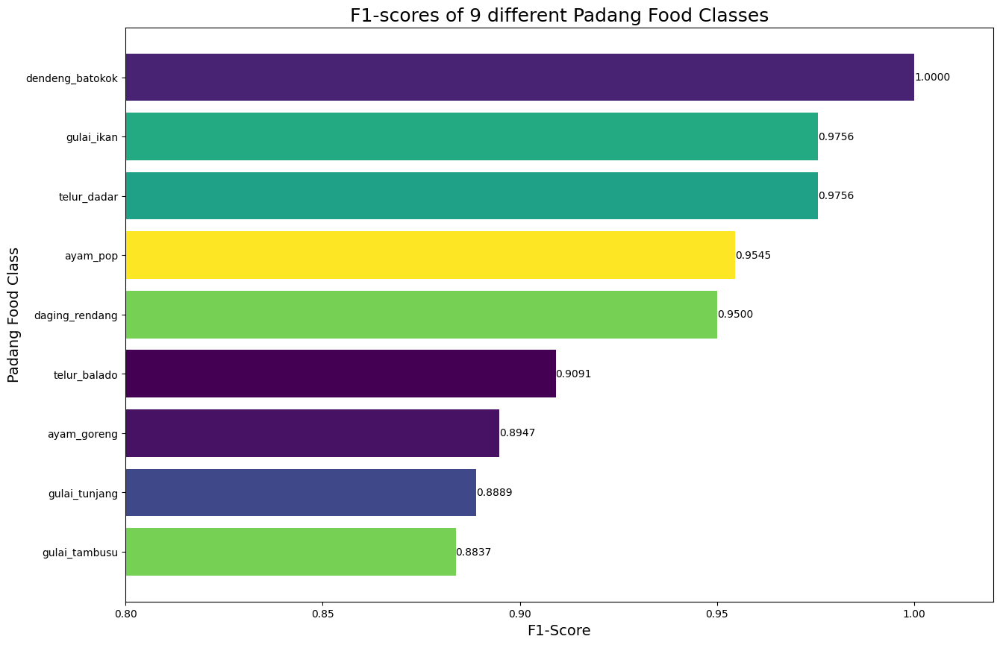

In [ ]:
# colors
class_f1_val = list(class_f1_scores.values())
denominator = max(class_f1_val) - min(class_f1_val)
scaled_data = [(datum-min(class_f1_val))/denominator for datum in class_f1_val]
colors = []
cmap = plt.colormaps['viridis']
for decimal in scaled_data:
  colors.append(cmap(decimal));


# plotting
fig, ax = plt.subplots(figsize=(15, 10))

scores = ax.barh(best_f1_scores['class_names'], best_f1_scores['f1-score'], color=colors)
ax.set_title('F1-scores of 9 different Padang Food Classes', fontsize=18)
ax.bar_label(scores, fmt='%.4f')
ax.invert_yaxis()
ax.set_xlabel('F1-Score', fontsize=14)
ax.set_ylabel('Padang Food Class', fontsize=14)
ax.set_xlim(0.8, 1.02)
ax.set_xticks(np.arange(0.8, 1.05, 0.05))

plt.savefig("/content/drive/MyDrive/ColabNotebooks/projects/IndoFoodNet/scores.png")
plt.show()

In [ ]:
fig = plt.figure(figsize=(10, 10))
plt.bar()

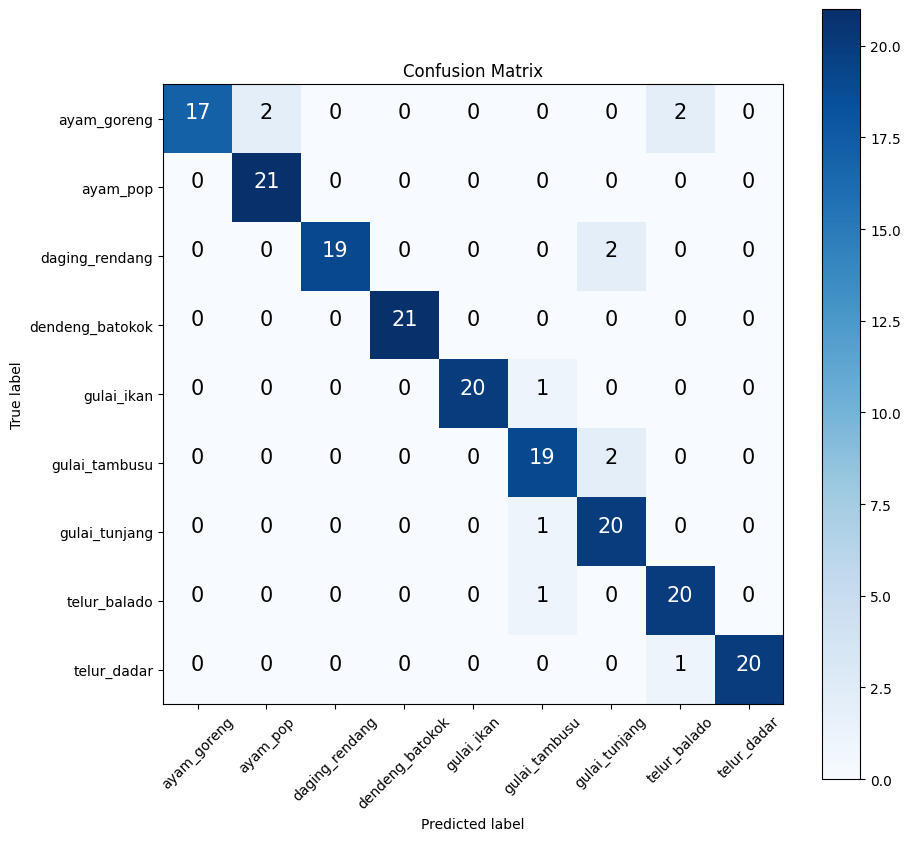

In [ ]:
cm = make_confusion_matrix(b1_true_labels, b1_preds, class_names)

In [ ]:
cm.savefig("/content/drive/MyDrive/ColabNotebooks/projects/IndoFoodNet/confusion_matrix.png")

In [ ]:
best_model.save('/content/drive/MyDrive/ColabNotebooks/projects/IndoFoodNet/best_model')

This model didn't reach the desired f1-score of 95.%. Instead, it got 93.69%. Further improvements could be made with better callbacks, larger data, and different base models.

##BONUS

### Visualizing Predictions

1/1 [==============================] - 2s 2s/step


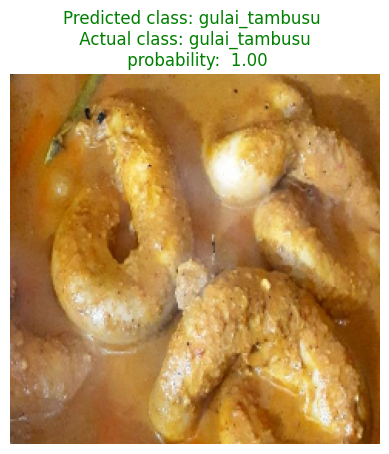

In [ ]:
random_visualize(best_model, b1_test_data, class_names)

1/1 [==============================] - 0s 40ms/step


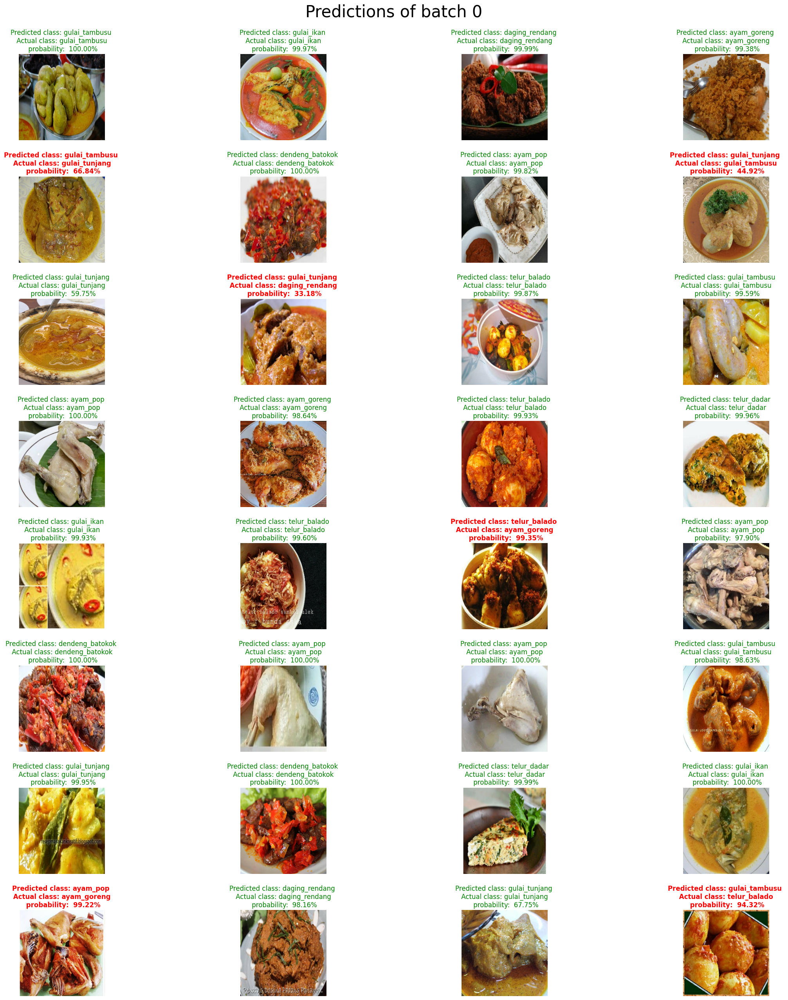

In [ ]:
batch_visualize(best_model, b1_test_data, class_names, 0)

1/1 [==============================] - 0s 42ms/step


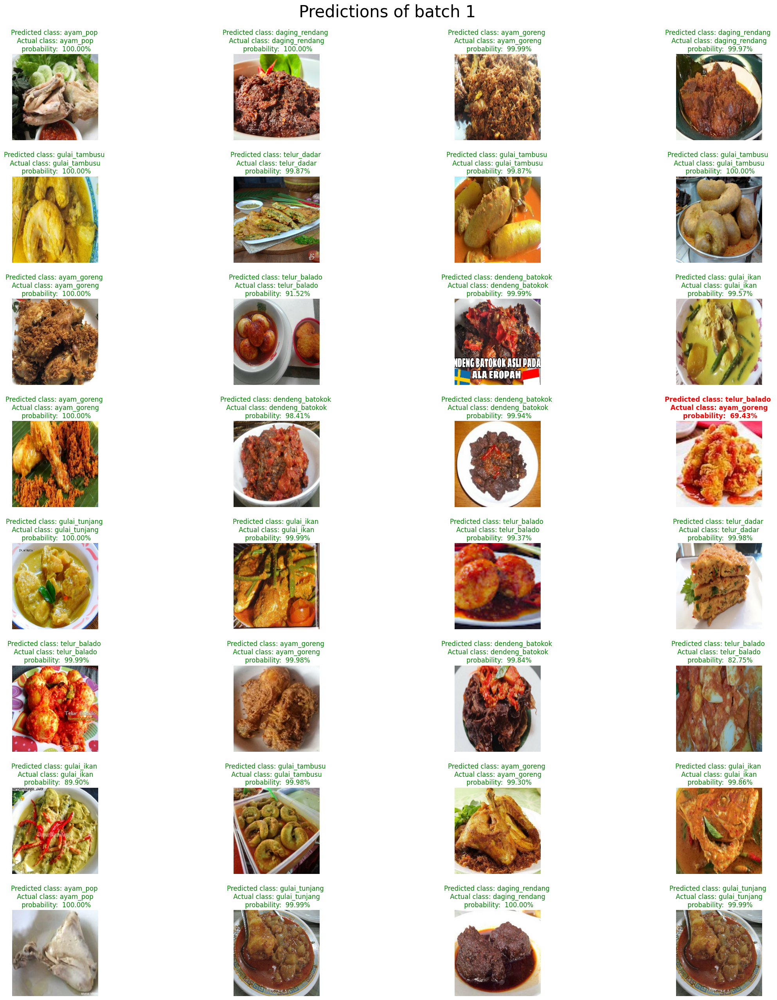

In [ ]:
batch_1_visualize = batch_visualize(best_model, b1_test_data, class_names, 1)
batch_1_visualize.savefig("/content/drive/MyDrive/ColabNotebooks/projects/IndoFoodNet/batch_1_visualize.png")

1/1 [==============================] - 0s 46ms/step


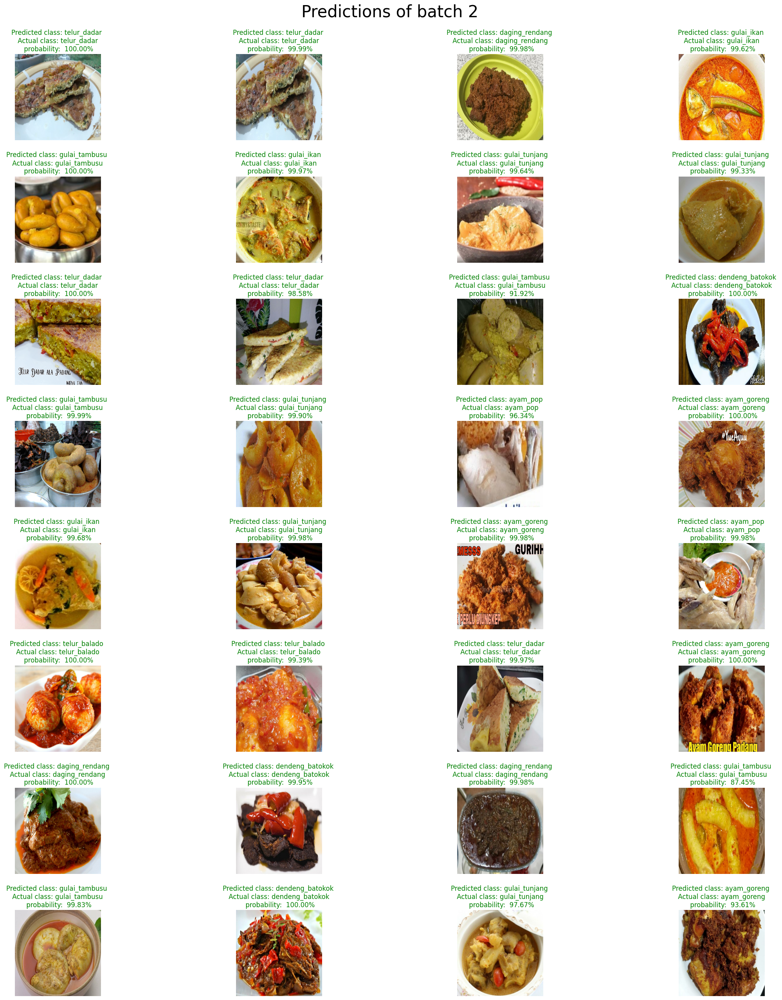

In [ ]:
batch_visualize(best_model, b1_test_data, class_names, 2)